# Clusterizacao - Case ImdbMovies

# IMDb TOP 250 Movies
![An image](https://static.amazon.jobs/teams/53/images/IMDb_Header_Page.jpg?1501027252)

**Este projeto consiste em treinar um sistema de recomendação de filmes utilizando as informações referentes aos top 250 filmes melhor avaliados pelo público na plataforma IMDb.**
*   A extração dos dados será feita por técnicas de web scraping (crawler).
*   O objetivo principal será agrupar os 250 filmes em "n" clusters classificados a partir das suas sinopses, aplicando técnicas de processamento de texto e algoritmos de clusterização.
*   Ao final, teremos um sistemas de recomendação baseado na similaridade das sinopses, e não apenas dos generos.

**Exemplo de aplicação prática: usuários receberão recomendações de filmes que estejam no mesmo cluster de sinopses de outros filmes que ele já tenha curtido.**

# Import das bibliotecas

In [39]:
#No Google Colab será necessário executar as instalações abaixo a cada nova sessão.
#No Jupyter Notebook, Jupyter Lab ou VSCode (localhost) basta instalar uma única vez.
# !pip uninstall pycaret
!pip install pandas
!pip install pycaret

In [40]:
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

from pycaret.clustering import *

## DataFrame

In [41]:
import pandas as pd
import os

# Caminho do arquivo
file_path = '/home/lucasmsilva/Documentos/autogenstudio/all_movies.csv'

# Verificar se o arquivo existe
if not os.path.exists(file_path):
    print(f"Erro: O arquivo não existe no caminho {file_path}")
    print("Conteúdo do diretório /content:")
    print(os.listdir('/content'))
else:
    # Tentar ler o arquivo
    try:
        # Tentar ler as primeiras linhas do arquivo para diagnóstico
        with open(file_path, 'r', encoding='utf-8') as f:
            print("Primeiras 5 linhas do arquivo:")
            for i, line in enumerate(f):
                if i < 5:
                    print(line.strip())
                else:
                    break

        # Tentar ler o arquivo com pandas
        df = pd.read_csv(file_path)
        print("\nArquivo lido com sucesso!")
        print(f"Número de linhas: {len(df)}")
        print(f"Número de colunas: {len(df.columns)}")
        print("\nPrimeiras 5 linhas do DataFrame:")
        print(df.head())

    except pd.errors.EmptyDataError:
        print("Erro: O arquivo está vazio.")
    except pd.errors.ParserError as e:
        print(f"Erro ao analisar o arquivo CSV: {str(e)}")
        print("Isso pode indicar um problema com o formato do arquivo.")
    except UnicodeDecodeError:
        print("Erro de decodificação Unicode. Tentando com encoding='latin-1'...")
        df = pd.read_csv(file_path, encoding='latin-1')
        print("Arquivo lido com sucesso usando encoding='latin-1'")
        print(df.head())
    except Exception as e:
        print(f"Ocorreu um erro ao ler o arquivo: {str(e)}")
        print(f"Tipo do erro: {type(e).__name__}")

Primeiras 5 linhas do arquivo:
title_pt;title_en;year;rating;genre;sinopse
Barbie;Barbie;2023;7.4;Aventura;Viver na Terra da Barbie é ser um ser perfeito em um lugar perfeito. A menos que você tenha uma crise existencial completa. Ou que você seja um Ken.
Um Sonho de Liberdade;1. The Shawshank Redemption;1994;9.3;Drama;Dois homens presos se reúnem ao longo de vários anos, encontrando consolo e eventual redenção através de atos de decência comum.
O Poderoso Chefão;2. The Godfather;1972;9.2;Policial;O patriarca idoso de uma dinastia do crime organizado transfere o controle de seu império clandestino para seu filho relutante.
Batman: O Cavaleiro das Trevas;3. The Dark Knight;2008;9.0;Ação;Quando a ameaça conhecida como O Coringa surge de seu passado, causa estragos e caos nas pessoas de Gotham. O Cavaleiro das Trevas deve aceitar um dos maiores testes para combater a injustiça.
Erro ao analisar o arquivo CSV: Error tokenizing data. C error: Expected 1 fields in line 3, saw 2

Isso pode in

#EDA - Exploratory Data Analysis

In [42]:
import pandas as pd
import os

# Caminho do arquivo
file_path = '/home/lucasmsilva/Documentos/autogenstudio/all_movies.csv'

# Verificar se o arquivo existe
if os.path.exists(file_path):
    try:
        # Tentar ler o arquivo CSV
        df = pd.read_csv(file_path, sep=';')
        print("Arquivo lido com sucesso!")

        # Exibir informações básicas
        print(f"\nShape do DataFrame: {df.shape}")

        print("\nPrimeiras 5 linhas do DataFrame:")
        print(df.head())

        print("\nInformações do DataFrame:")
        print(df.info())

        print("\nNomes das colunas:")
        print(df.columns.tolist())

        print("\nResumo estatístico das colunas numéricas:")
        print(df.describe())

    except pd.errors.EmptyDataError:
        print("Erro: O arquivo está vazio.")
    except pd.errors.ParserError as e:
        print(f"Erro ao analisar o arquivo CSV: {str(e)}")
        print("Isso pode indicar um problema com o formato do arquivo ou o separador usado.")
    except Exception as e:
        print(f"Ocorreu um erro ao ler o arquivo: {str(e)}")
else:
    print(f"Erro: O arquivo não foi encontrado no caminho {file_path}")
    print("Conteúdo do diretório /content:")
    print(os.listdir('/content'))

Arquivo lido com sucesso!

Shape do DataFrame: (250, 6)

Primeiras 5 linhas do DataFrame:
                         title_pt                     title_en  year  rating  \
0                          Barbie                       Barbie  2023     7.4   
1           Um Sonho de Liberdade  1. The Shawshank Redemption  1994     9.3   
2               O Poderoso Chefão             2. The Godfather  1972     9.2   
3  Batman: O Cavaleiro das Trevas           3. The Dark Knight  2008     9.0   
4            O Poderoso Chefão II     4. The Godfather Part II  1974     9.0   

      genre                                            sinopse  
0  Aventura  Viver na Terra da Barbie é ser um ser perfeito...  
1     Drama  Dois homens presos se reúnem ao longo de vário...  
2  Policial  O patriarca idoso de uma dinastia do crime org...  
3      Ação  Quando a ameaça conhecida como O Coringa surge...  
4  Policial  Em 1950, Michael Corleone, agora à frente da f...  

Informações do DataFrame:
<class 'pand

In [43]:
# Adjusting variable types
df['year'] = df['year'].astype('int64')
df['rating'] = df['rating'].astype('float64')

In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250 entries, 0 to 249
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   title_pt  250 non-null    object 
 1   title_en  250 non-null    object 
 2   year      250 non-null    int64  
 3   rating    250 non-null    float64
 4   genre     250 non-null    object 
 5   sinopse   250 non-null    object 
dtypes: float64(1), int64(1), object(4)
memory usage: 11.8+ KB


In [45]:
df.describe()

,year,rating
count,250.000000,250.000000
mean,1986.684000,8.302800
std,25.508171,0.239545
min,1921.000000,7.400000
25%,1966.000000,8.100000
50%,1994.000000,8.200000
75%,2007.000000,8.400000
max,2023.000000,9.300000


## Plots

In [46]:
df.genre.value_counts('d')

genre
Drama         0.276
Ação          0.180
Policial      0.140
Animação      0.096
Biografia     0.092
Comédia       0.092
Aventura      0.084
Terror        0.016
Mistério      0.016
Faroeste      0.004
Filme noir    0.004
Name: proportion, dtype: float64

In [47]:
fig = px.bar(df.genre.value_counts('d')*100,
             text_auto=True,
             title = '% de Filmes por Gênero',
             labels={'index':'Gênero',
                     'value':'% de Filmes'})
fig.show()

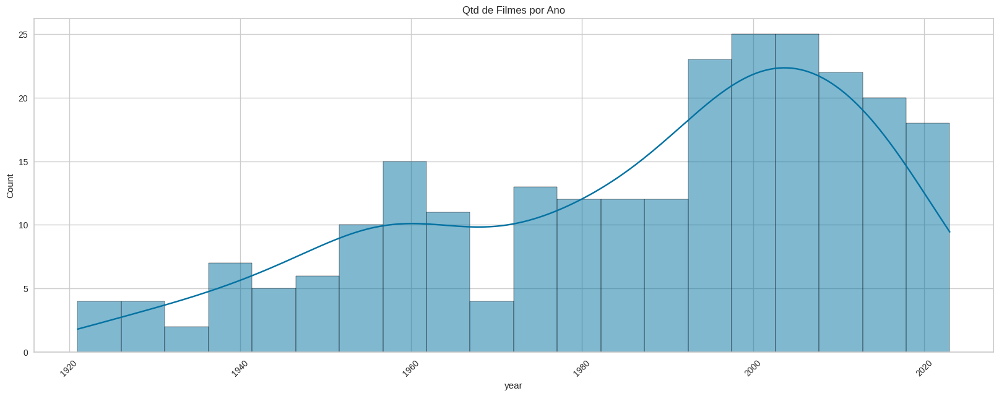

In [48]:
plt.figure(figsize = (20,7))
sns.histplot( df,
              x = 'year',
              kde = True, bins = 20).set_title('Qtd de Filmes por Ano')
plt.xticks(rotation=45)
plt.show()

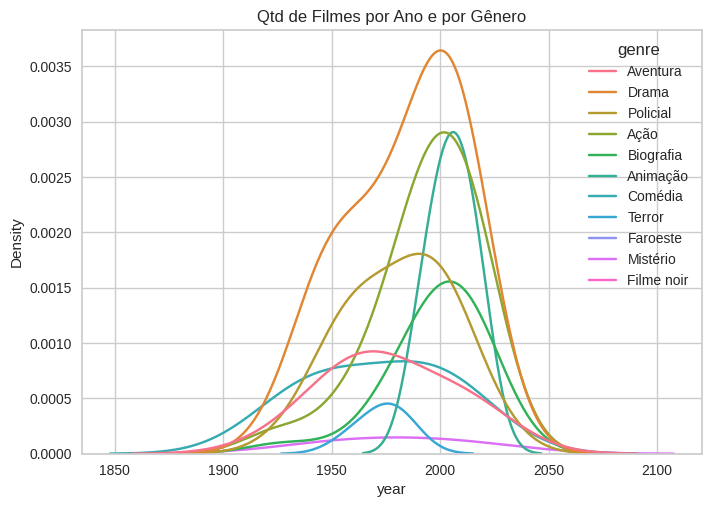

In [49]:
sns.kdeplot( df, x = 'year', hue = 'genre', bw_adjust = 1.5, warn_singular = False).set_title('Qtd de Filmes por Ano e por Gênero')
plt.show()

# Pré-processamento de texto

In [50]:
#convert sinopses to lowercase
df_processed = df.copy()
df_processed['sinopse'] = df_processed['sinopse'].str.lower()
df_processed['sinopse'].head()

0    viver na terra da barbie é ser um ser perfeito...
1    dois homens presos se reúnem ao longo de vário...
2    o patriarca idoso de uma dinastia do crime org...
3    quando a ameaça conhecida como o coringa surge...
4    em 1950, michael corleone, agora à frente da f...
Name: sinopse, dtype: object

In [51]:
def qty_words(text):
    words= text.split()
    word_count = len(words)
    return word_count

In [52]:
### Feature Engineering
df_processed['word_count'] = df_processed['sinopse'].apply(qty_words).astype('int64')
df_processed.head()

,title_pt,title_en,year,rating,genre,sinopse,word_count
0,Barbie,Barbie,2023,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,29
1,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21
2,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20
3,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33
4,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41


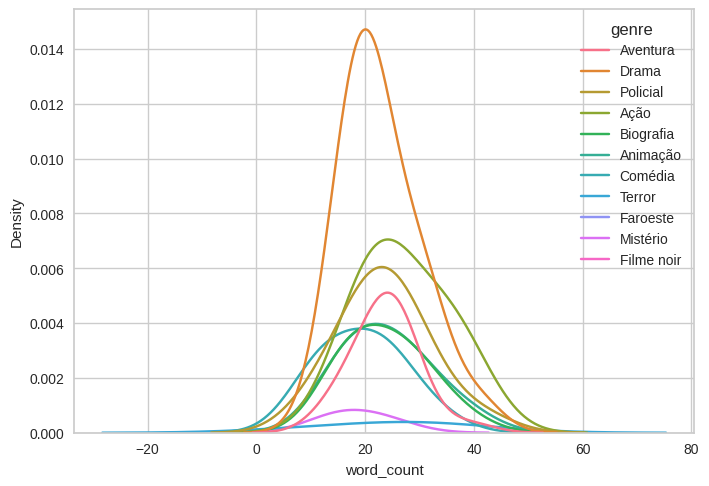

In [53]:
sns.kdeplot( df_processed, x = 'word_count', hue = 'genre', bw_adjust = 1.5, warn_singular = False)
plt.show()

## Nuvem de palavras

### Antes de remover as stopwords

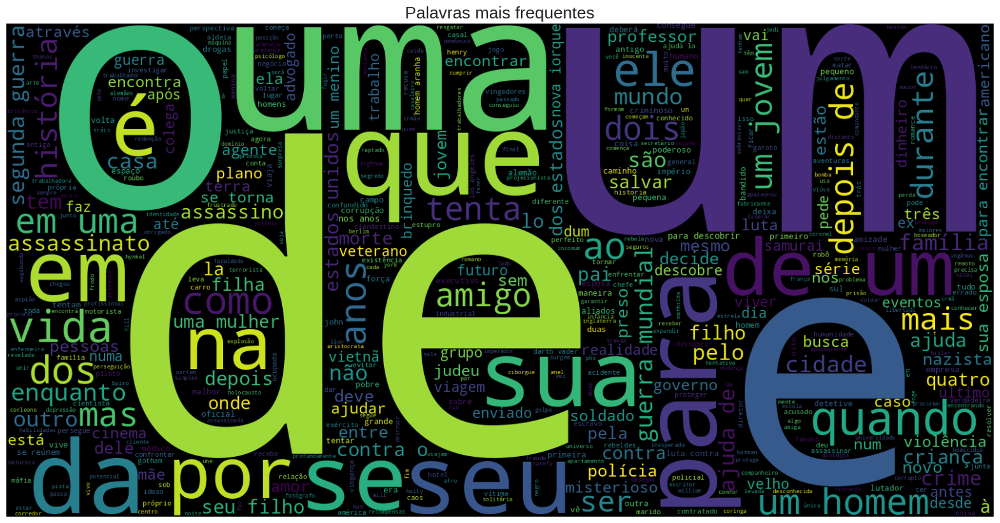

In [54]:
text = ' '.join([phrase for phrase in df_processed['sinopse']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes', fontsize = 19)
plt.show()

### Após remoção das stopwords

In [55]:
import nltk
nltk.download('stopwords')

stopwords = nltk.corpus.stopwords.words('portuguese')
print(stopwords)

['a', 'à', 'ao', 'aos', 'aquela', 'aquelas', 'aquele', 'aqueles', 'aquilo', 'as', 'às', 'até', 'com', 'como', 'da', 'das', 'de', 'dela', 'delas', 'dele', 'deles', 'depois', 'do', 'dos', 'e', 'é', 'ela', 'elas', 'ele', 'eles', 'em', 'entre', 'era', 'eram', 'éramos', 'essa', 'essas', 'esse', 'esses', 'esta', 'está', 'estamos', 'estão', 'estar', 'estas', 'estava', 'estavam', 'estávamos', 'este', 'esteja', 'estejam', 'estejamos', 'estes', 'esteve', 'estive', 'estivemos', 'estiver', 'estivera', 'estiveram', 'estivéramos', 'estiverem', 'estivermos', 'estivesse', 'estivessem', 'estivéssemos', 'estou', 'eu', 'foi', 'fomos', 'for', 'fora', 'foram', 'fôramos', 'forem', 'formos', 'fosse', 'fossem', 'fôssemos', 'fui', 'há', 'haja', 'hajam', 'hajamos', 'hão', 'havemos', 'haver', 'hei', 'houve', 'houvemos', 'houver', 'houvera', 'houverá', 'houveram', 'houvéramos', 'houverão', 'houverei', 'houverem', 'houveremos', 'houveria', 'houveriam', 'houveríamos', 'houvermos', 'houvesse', 'houvessem', 'houvésse

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/lucasmsilva/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


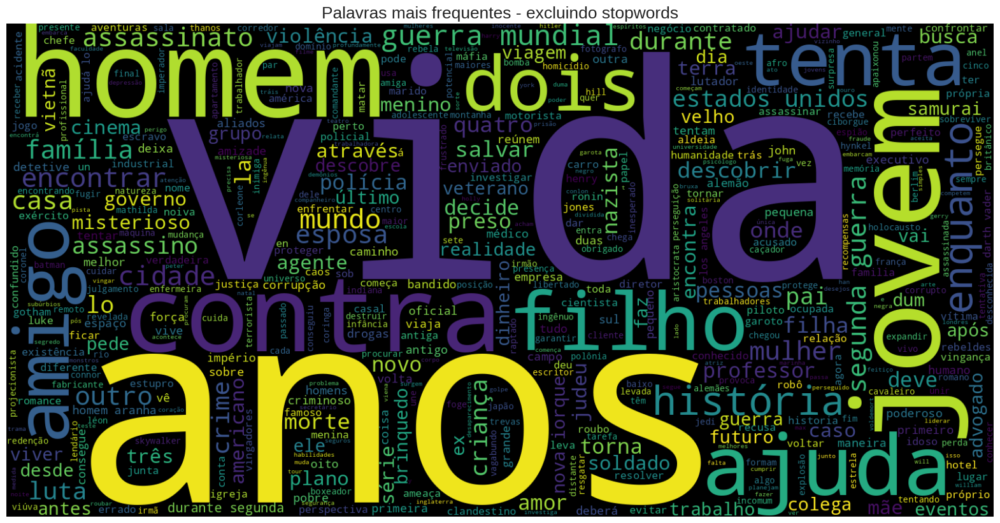

In [56]:
df_processed['sinopse_no_stopwords'] = df_processed['sinopse'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
text = ' '.join([phrase for phrase in df_processed['sinopse_no_stopwords']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes - excluindo stopwords', fontsize = 19)
plt.show()

## Aplicando TF-IDF
Term Frequency-Inverse Document Frequency

O TF-IDF define a importância de um termo levando em consideração a importância desse termo em um único documento e dimensionando-o por sua importância em todos os documentos.

In [57]:
# initialize the vectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True, min_df=5, max_df=0.95)
# fit_transform applies TF-IDF to clean texts - we save the array of vectors in X
X = vectorizer.fit_transform(df_processed['sinopse_no_stopwords'])

In [58]:
print(X.shape)
X.toarray()

(250, 82)


array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.70710678],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

# AutoML | PyCaret - Clustering

# Model 1

## Setup

In [59]:
s = setup(data = X.toarray(),
          session_id = 123)

,Description,Value
0,Session id,123
1,Original data shape,"(250, 82)"
2,Transformed data shape,"(250, 82)"
3,Numeric features,82
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,CPU Jobs,-1
9,Use GPU,False


## Create Model

In [60]:
mdl_kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0287,4.4907,2.6239,0,0,0


In [61]:
mdl_dbscan = create_model('dbscan')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2313,0.3853,4.8130,0,0,0


## Assign Model

In [62]:
df_kmeans = assign_model(mdl_kmeans)
display(df_kmeans.Cluster.value_counts())
df_kmeans

Cluster
Cluster 2    219
Cluster 1     19
Cluster 0      6
Cluster 3      6
Name: count, dtype: int64

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,...,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,feature_80,feature_81,feature_82,Cluster
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.707107,Cluster 2
1,0.0,0.0,0.0,0.0,0.0,0.0,0.499298,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 2
2,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 2
3,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 2
4,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,0.0,0.0,0.0,0.0,0.0,0.0,0.376643,0.0,0.0,0.0,...,0.0,0.0,0.0,0.469184,0.0,0.0,0.0,0.0,0.000000,Cluster 2
246,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 2
247,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,0.0,0.000000,Cluster 2
248,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 2


In [63]:
df_db = assign_model(mdl_dbscan)
df_db.Cluster.value_counts()

Cluster
Cluster -1    241
Cluster 0       9
Name: count, dtype: int64

## Analyze Models

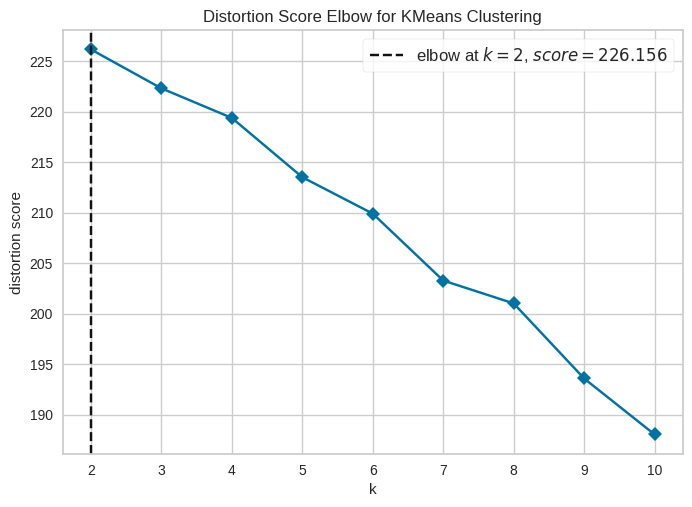

In [64]:
plot_model(mdl_kmeans, plot = 'elbow')

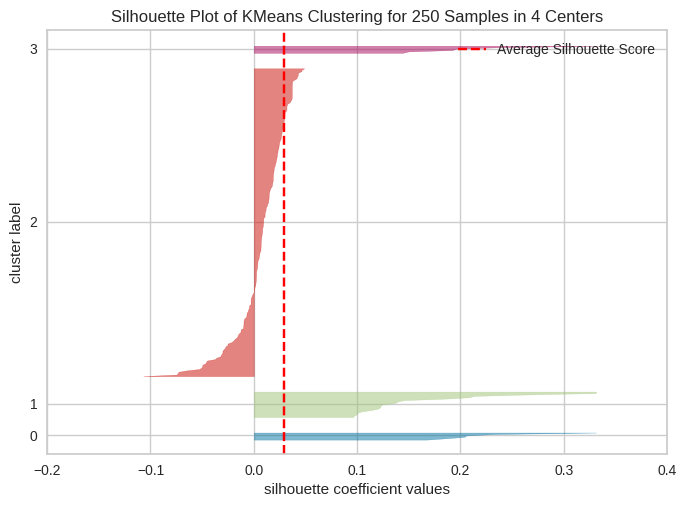

In [65]:
plot_model(mdl_kmeans, plot = 'silhouette')

In [66]:
plot_model(mdl_kmeans, plot = 'distribution')

In [67]:
plot_model(mdl_kmeans, plot = 'cluster')

In [68]:
plot_model(mdl_kmeans, plot = 'tsne')

In [69]:
evaluate_model(mdl_kmeans)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Filmes por cluster

In [70]:
df_processed['cluster'] = df_kmeans['Cluster']
df_processed

,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords,cluster
0,Barbie,Barbie,2023,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,29,viver terra barbie perfeito lugar perfeito. me...,Cluster 2
1,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21,"dois homens presos reúnem longo vários anos, e...",Cluster 2
2,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20,patriarca idoso dinastia crime organizado tran...,Cluster 2
3,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33,"ameaça conhecida coringa surge passado, causa ...",Cluster 2
4,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41,"1950, michael corleone, agora frente família, ...",Cluster 2
...,...,...,...,...,...,...,...,...,...
245,Histórias Cruzadas,246. The Help,2011,8.1,Drama,uma aspirante a escritora durante o movimento ...,32,aspirante escritora durante movimento direitos...,Cluster 2
246,Quando Duas Mulheres Pecam,247. Persona,1966,8.1,Drama,uma enfermeira é encarregada de uma atriz sile...,17,enfermeira encarregada atriz silenciosa descob...,Cluster 2
247,A Vida de Brian,248. Life of Brian,1979,8.0,Comédia,nascido no natal original no estábulo ao lado ...,20,"nascido natal original estábulo lado jesus, br...",Cluster 2
248,Aladdin,249. Aladdin,1992,8.0,Animação,um menino de rua bondoso e um vizir competem p...,23,menino rua bondoso vizir competem lâmpada mági...,Cluster 2


## % de Gêneros por Cluster

In [71]:
fig = px.bar(df_processed.cluster.value_counts(),
             text_auto = True,
             title = 'Qtd de Filmes por Cluster',
             labels = {'index': 'Cluster #',
                       'value':'Qtd. de Filmes'})
fig.show()

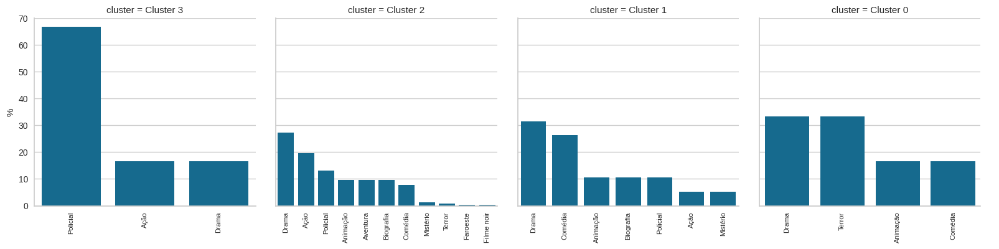

In [72]:
df_plot = df_processed.groupby(['cluster', 'genre'])['title_pt'].count()
df_plot = df_plot.reset_index()
df_plot.rename(columns = {'title_pt':'count'}, inplace = True)
df_plot['%'] = 100 * df_plot['count'] / df_plot.groupby('cluster')['count'].transform('sum')
df_plot = df_plot.sort_values(['cluster', '%'], ascending = False).groupby('cluster').head(11)

fig = sns.catplot(
    data=df_plot, x="genre", y = "%", col="cluster",
    kind="bar", height=4, aspect=1, sharex = False);
fig.set_xlabels('');
fig.set_xticklabels(rotation=90, size = 8);

## Ano de Lançamento por Cluster

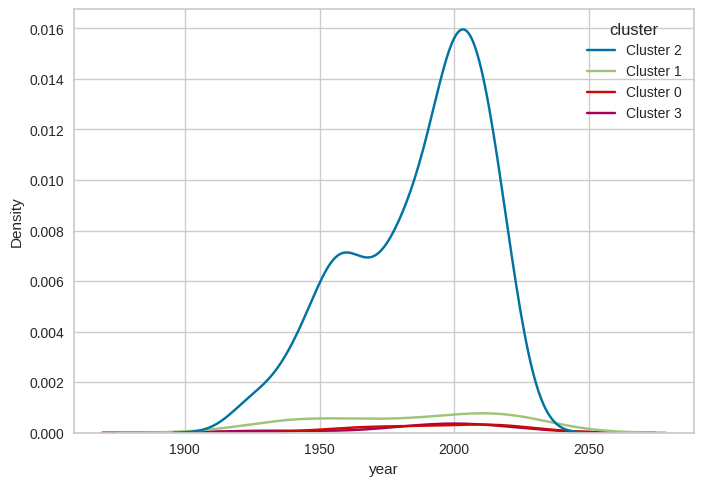

In [73]:
sns.kdeplot(df_processed, x = 'year', hue = 'cluster');

## Radar | Gêneros por Cluster

In [74]:
df_pivot = df_plot.copy()
df_pivot = df_pivot.pivot(index = 'cluster', columns = 'genre', values = '%')
df_pivot.fillna(0, inplace = True)
df_pivot = df_pivot.T.reset_index()
df_pivot.index.name = None
df_pivot

cluster,genre,Cluster 0,Cluster 1,Cluster 2,Cluster 3
0,Animação,16.666667,10.526316,9.589041,0.000000
1,Aventura,0.000000,0.000000,9.589041,0.000000
2,Ação,0.000000,5.263158,19.634703,16.666667
3,Biografia,0.000000,10.526316,9.589041,0.000000
4,Comédia,16.666667,26.315789,7.762557,0.000000
5,Drama,33.333333,31.578947,27.397260,16.666667
6,Faroeste,0.000000,0.000000,0.456621,0.000000
7,Filme noir,0.000000,0.000000,0.456621,0.000000
8,Mistério,0.000000,5.263158,1.369863,0.000000
9,Policial,0.000000,10.526316,13.242009,66.666667


In [75]:
df_polar = df_pivot.melt(id_vars=['genre'])
df_polar.head()

,genre,cluster,value
0,Animação,Cluster 0,16.666667
1,Aventura,Cluster 0,0.000000
2,Ação,Cluster 0,0.000000
3,Biografia,Cluster 0,0.000000
4,Comédia,Cluster 0,16.666667


In [76]:
fig = px.line_polar(df_polar, r='value', theta='genre', color = 'cluster', line_close=True)
fig.show();

## Nuvem de Palavras por Cluster

## Considerações Finais
* **Exercício: Reescrever as análises / conclusões devido a atualização da base**

Cluster 2


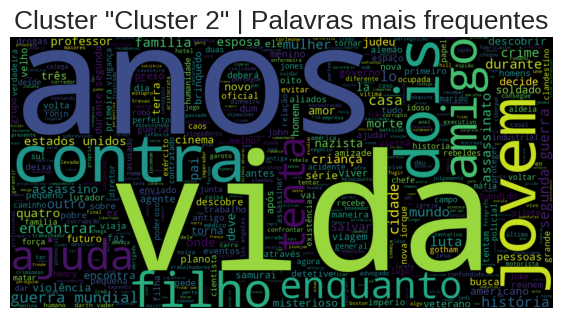

Cluster 1


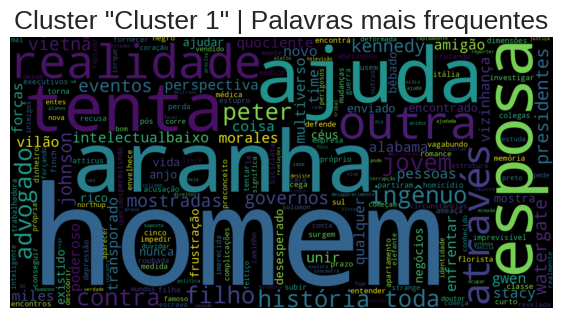

Cluster 0


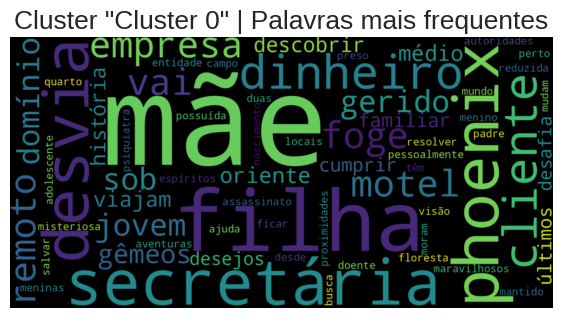

Cluster 3


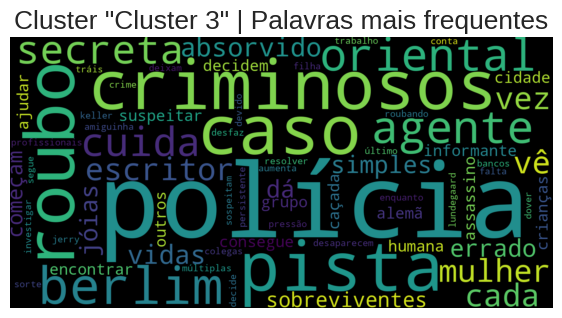

In [77]:
def word_cloud_cluster(cluster:int):
  text = ' '.join([phrase for phrase in df_processed.loc[df_processed.cluster == cluster]['sinopse_no_stopwords']])
  plt.figure(figsize=(7,5), facecolor='None')
  wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Cluster "{cluster}" | Palavras mais frequentes', fontsize = 19)
  plt.show()
  return

list_clusters = df_processed.cluster.unique().tolist()
for c in list_clusters:
  print(c)
  word_cloud_cluster(c)

## Conclusões | Model 1

In [78]:
#Escreva aqui as suas análises / conclusões

# Model 2

## Adicionando demais features do df all_movies ao X

In [79]:
pd.DataFrame(X.toarray()).shape

(250, 82)

In [80]:
df_processed.shape

(250, 9)

In [81]:
df_all = pd.concat([
                    df_processed.drop('cluster', axis = 1),
                    pd.DataFrame(X.toarray())
                   ]
                   , axis = 1
                   )
df_all

,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords,0,1,...,72,73,74,75,76,77,78,79,80,81
0,Barbie,Barbie,2023,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,29,viver terra barbie perfeito lugar perfeito. me...,0.0,0.0,...,0.707107,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.707107
1,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21,"dois homens presos reúnem longo vários anos, e...",0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
2,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20,patriarca idoso dinastia crime organizado tran...,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
3,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33,"ameaça conhecida coringa surge passado, causa ...",0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
4,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41,"1950, michael corleone, agora frente família, ...",0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,Histórias Cruzadas,246. The Help,2011,8.1,Drama,uma aspirante a escritora durante o movimento ...,32,aspirante escritora durante movimento direitos...,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.469184,0.0,0.0,0.0,0.0,0.000000
246,Quando Duas Mulheres Pecam,247. Persona,1966,8.1,Drama,uma enfermeira é encarregada de uma atriz sile...,17,enfermeira encarregada atriz silenciosa descob...,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
247,A Vida de Brian,248. Life of Brian,1979,8.0,Comédia,nascido no natal original no estábulo ao lado ...,20,"nascido natal original estábulo lado jesus, br...",0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,0.0,0.000000
248,Aladdin,249. Aladdin,1992,8.0,Animação,um menino de rua bondoso e um vizir competem p...,23,menino rua bondoso vizir competem lâmpada mági...,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000


## Setup

In [82]:
s = setup(data = df_all,
          session_id = 123)

,Description,Value
0,Session id,123
1,Original data shape,"(250, 90)"
2,Transformed data shape,"(250, 1096)"
3,Numeric features,85
4,Categorical features,5
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


## Create Model

In [83]:
mdl_kmeans_all = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3730,422.3215,0.9122,0,0,0


## Assign Model

In [84]:
df_kmeans_all = assign_model(mdl_kmeans_all)
display(df_kmeans_all.Cluster.value_counts())
df_kmeans_all

Cluster
Cluster 3    79
Cluster 1    66
Cluster 0    57
Cluster 2    48
Name: count, dtype: int64

,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords,0,1,...,73,74,75,76,77,78,79,80,81,Cluster
0,Barbie,Barbie,2023,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,29,viver terra barbie perfeito lugar perfeito. me...,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.707107,Cluster 2
1,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21,"dois homens presos reúnem longo vários anos, e...",0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 3
2,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20,patriarca idoso dinastia crime organizado tran...,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 0
3,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33,"ameaça conhecida coringa surge passado, causa ...",0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 2
4,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41,"1950, michael corleone, agora frente família, ...",0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,Histórias Cruzadas,246. The Help,2011,8.1,Drama,uma aspirante a escritora durante o movimento ...,32,aspirante escritora durante movimento direitos...,0.0,0.0,...,0.0,0.0,0.0,0.469184,0.0,0.0,0.0,0.0,0.000000,Cluster 2
246,Quando Duas Mulheres Pecam,247. Persona,1966,8.1,Drama,uma enfermeira é encarregada de uma atriz sile...,17,enfermeira encarregada atriz silenciosa descob...,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 1
247,A Vida de Brian,248. Life of Brian,1979,8.0,Comédia,nascido no natal original no estábulo ao lado ...,20,"nascido natal original estábulo lado jesus, br...",0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,0.0,0.000000,Cluster 0
248,Aladdin,249. Aladdin,1992,8.0,Animação,um menino de rua bondoso e um vizir competem p...,23,menino rua bondoso vizir competem lâmpada mági...,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 0


## Analyze Model

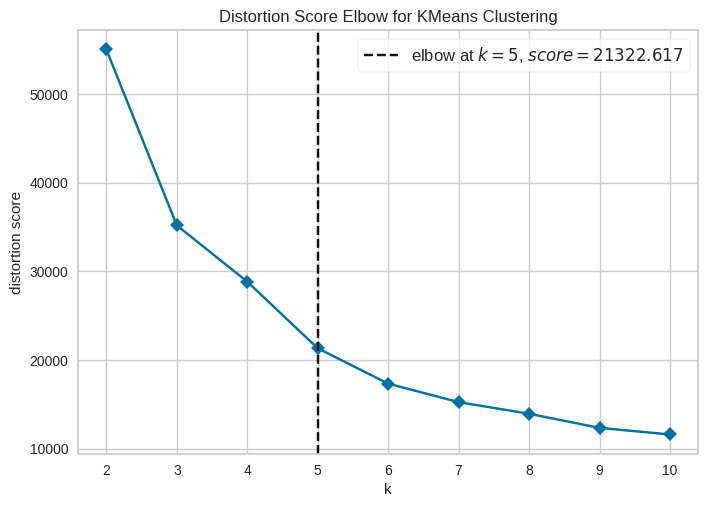

In [85]:
plot_model(mdl_kmeans_all, plot = 'elbow')

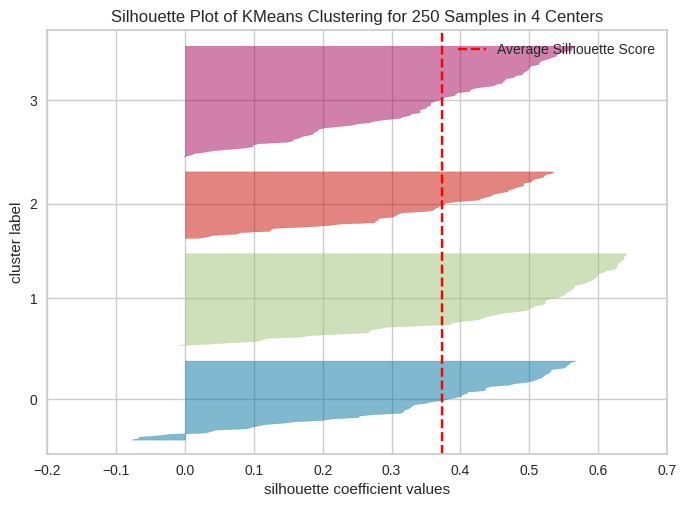

In [86]:
plot_model(mdl_kmeans_all, plot = 'silhouette')

In [87]:
plot_model(mdl_kmeans_all, plot = 'distribution')

In [88]:
plot_model(mdl_kmeans_all, plot = 'cluster')

In [89]:
plot_model(mdl_kmeans_all, plot = 'tsne')

In [90]:
evaluate_model(mdl_kmeans_all)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Filmes por cluster

In [91]:
df_processed['cluster'] = df_kmeans_all['Cluster']
df_processed

,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords,cluster
0,Barbie,Barbie,2023,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,29,viver terra barbie perfeito lugar perfeito. me...,Cluster 2
1,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21,"dois homens presos reúnem longo vários anos, e...",Cluster 3
2,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20,patriarca idoso dinastia crime organizado tran...,Cluster 0
3,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33,"ameaça conhecida coringa surge passado, causa ...",Cluster 2
4,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41,"1950, michael corleone, agora frente família, ...",Cluster 0
...,...,...,...,...,...,...,...,...,...
245,Histórias Cruzadas,246. The Help,2011,8.1,Drama,uma aspirante a escritora durante o movimento ...,32,aspirante escritora durante movimento direitos...,Cluster 2
246,Quando Duas Mulheres Pecam,247. Persona,1966,8.1,Drama,uma enfermeira é encarregada de uma atriz sile...,17,enfermeira encarregada atriz silenciosa descob...,Cluster 1
247,A Vida de Brian,248. Life of Brian,1979,8.0,Comédia,nascido no natal original no estábulo ao lado ...,20,"nascido natal original estábulo lado jesus, br...",Cluster 0
248,Aladdin,249. Aladdin,1992,8.0,Animação,um menino de rua bondoso e um vizir competem p...,23,menino rua bondoso vizir competem lâmpada mági...,Cluster 0


## % de Gêneros por Cluster

In [92]:
fig = px.bar(df_processed.cluster.value_counts(),
             text_auto = True,
             title = 'Qtd de Filmes por Cluster',
             labels = {'index': 'Cluster #',
                       'value':'Qtd. de Filmes'})
fig.show()

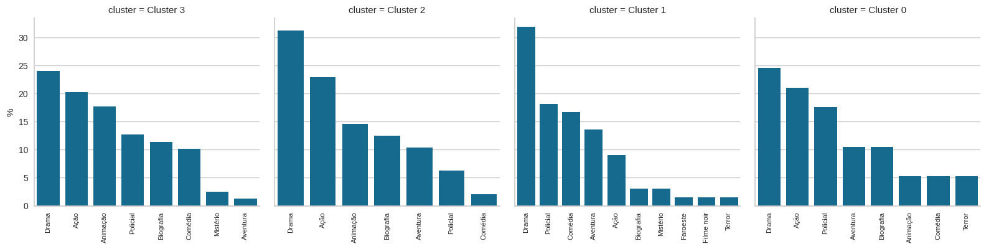

In [93]:
df_plot = df_processed.groupby(['cluster', 'genre'])['title_pt'].count()
df_plot = df_plot.reset_index()
df_plot.rename(columns = {'title_pt':'count'}, inplace = True)
df_plot['%'] = 100 * df_plot['count'] / df_plot.groupby('cluster')['count'].transform('sum')
df_plot = df_plot.sort_values(['cluster', '%'], ascending = False).groupby('cluster').head(11)

fig = sns.catplot(
    data=df_plot, x="genre", y = "%", col="cluster",
    kind="bar", height=4, aspect=1, sharex = False);
fig.set_xlabels('');
fig.set_xticklabels(rotation=90, size = 8);

## Ano de Lançamento por Cluster

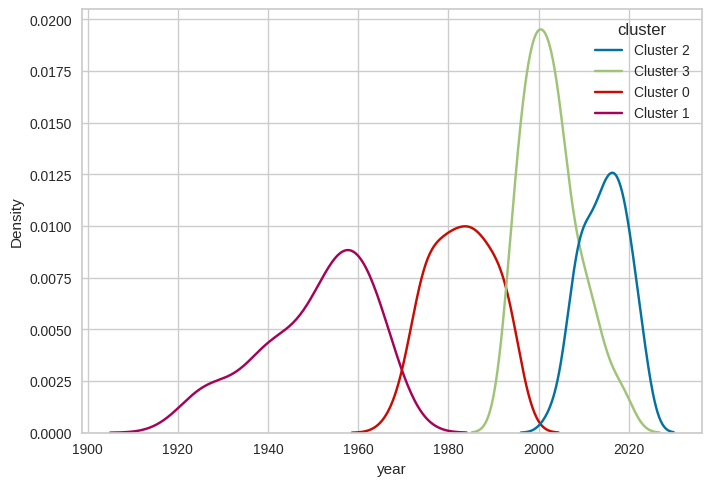

In [94]:
sns.kdeplot(df_processed, x = 'year', hue = 'cluster');

## Radar | Gêneros por Cluster

In [95]:
df_pivot = df_plot.copy()
df_pivot = df_pivot.pivot(index = 'cluster', columns = 'genre', values = '%')
df_pivot.fillna(0, inplace = True)
df_pivot = df_pivot.T.reset_index()
df_pivot.index.name = None
df_pivot

cluster,genre,Cluster 0,Cluster 1,Cluster 2,Cluster 3
0,Animação,5.263158,0.000000,14.583333,17.721519
1,Aventura,10.526316,13.636364,10.416667,1.265823
2,Ação,21.052632,9.090909,22.916667,20.253165
3,Biografia,10.526316,3.030303,12.500000,11.392405
4,Comédia,5.263158,16.666667,2.083333,10.126582
5,Drama,24.561404,31.818182,31.250000,24.050633
6,Faroeste,0.000000,1.515152,0.000000,0.000000
7,Filme noir,0.000000,1.515152,0.000000,0.000000
8,Mistério,0.000000,3.030303,0.000000,2.531646
9,Policial,17.543860,18.181818,6.250000,12.658228


In [96]:
df_polar = df_pivot.melt(id_vars=['genre'])
df_polar.head()

,genre,cluster,value
0,Animação,Cluster 0,5.263158
1,Aventura,Cluster 0,10.526316
2,Ação,Cluster 0,21.052632
3,Biografia,Cluster 0,10.526316
4,Comédia,Cluster 0,5.263158


In [97]:
fig = px.line_polar(df_polar, r='value', theta='genre', color = 'cluster', line_close=True)
fig.show();

## Nuvem de Palavras por Cluster

## Considerações Finais
* **Exercício: Reescrever as análises / conclusões devido a atualização da base**

Cluster 2


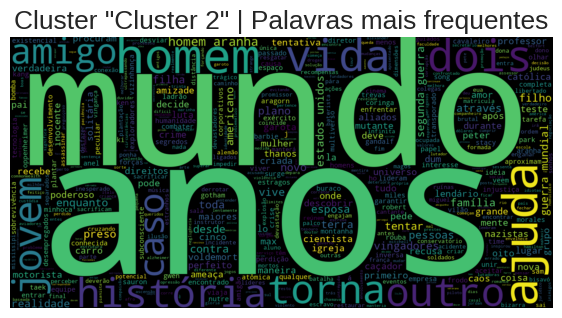

Cluster 3


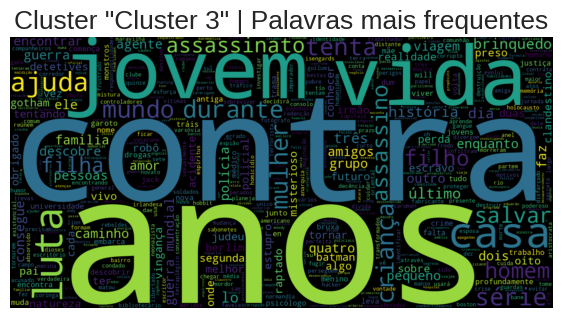

Cluster 0


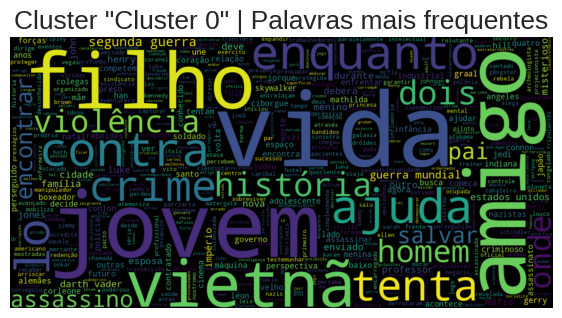

Cluster 1


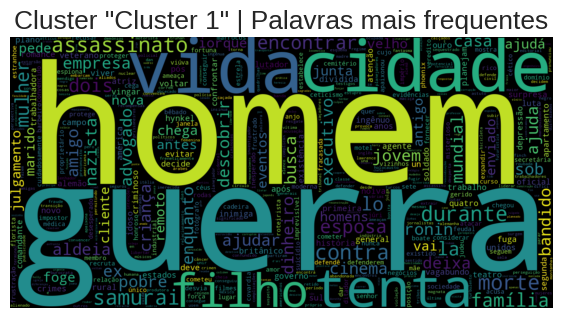

In [98]:
def word_cloud_cluster(cluster:int):
  text = ' '.join([phrase for phrase in df_processed.loc[df_processed.cluster == cluster]['sinopse_no_stopwords']])
  plt.figure(figsize=(7,5), facecolor='None')
  wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Cluster "{cluster}" | Palavras mais frequentes', fontsize = 19)
  plt.show()
  return

list_clusters = df_processed.cluster.unique().tolist()
for c in list_clusters:
  print(c)
  word_cloud_cluster(c)

## Conclusões | Model 2

In [99]:
#Escreva aqui as suas análises / conclusões

# Model #3

## Excluindo a feature "year" dado que o modelo claramente separou os clusters com forte influência do ano de lançamento dos filmes

In [100]:
pd.DataFrame(X.toarray()).shape

(250, 82)

In [101]:
df_processed.shape

(250, 9)

In [102]:
df_all_no_year = pd.concat([
                    df_processed.drop(['cluster','year'], axis = 1),
                    pd.DataFrame(X.toarray())
                   ]
                   , axis = 1
                   )
df_all_no_year

,title_pt,title_en,rating,genre,sinopse,word_count,sinopse_no_stopwords,0,1,2,...,72,73,74,75,76,77,78,79,80,81
0,Barbie,Barbie,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,29,viver terra barbie perfeito lugar perfeito. me...,0.0,0.0,0.0,...,0.707107,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.707107
1,Um Sonho de Liberdade,1. The Shawshank Redemption,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21,"dois homens presos reúnem longo vários anos, e...",0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
2,O Poderoso Chefão,2. The Godfather,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20,patriarca idoso dinastia crime organizado tran...,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
3,Batman: O Cavaleiro das Trevas,3. The Dark Knight,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33,"ameaça conhecida coringa surge passado, causa ...",0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
4,O Poderoso Chefão II,4. The Godfather Part II,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41,"1950, michael corleone, agora frente família, ...",0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,Histórias Cruzadas,246. The Help,8.1,Drama,uma aspirante a escritora durante o movimento ...,32,aspirante escritora durante movimento direitos...,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.469184,0.0,0.0,0.0,0.0,0.000000
246,Quando Duas Mulheres Pecam,247. Persona,8.1,Drama,uma enfermeira é encarregada de uma atriz sile...,17,enfermeira encarregada atriz silenciosa descob...,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
247,A Vida de Brian,248. Life of Brian,8.0,Comédia,nascido no natal original no estábulo ao lado ...,20,"nascido natal original estábulo lado jesus, br...",0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,0.0,0.000000
248,Aladdin,249. Aladdin,8.0,Animação,um menino de rua bondoso e um vizir competem p...,23,menino rua bondoso vizir competem lâmpada mági...,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000


## Setup

In [103]:
s = setup(data = df_all_no_year,
          session_id = 123)

,Description,Value
0,Session id,123
1,Original data shape,"(250, 89)"
2,Transformed data shape,"(250, 1095)"
3,Numeric features,84
4,Categorical features,5
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


## Create Model

In [104]:
mdl_kmeans_all_no_year = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3340,370.4278,0.9196,0,0,0


## Assign Model

In [105]:
df_kmeans_all_no_year = assign_model(mdl_kmeans_all_no_year)
display(df_kmeans_all_no_year.Cluster.value_counts())
df_kmeans_all_no_year

Cluster
Cluster 3    86
Cluster 1    66
Cluster 0    59
Cluster 2    39
Name: count, dtype: int64

,title_pt,title_en,rating,genre,sinopse,word_count,sinopse_no_stopwords,0,1,2,...,73,74,75,76,77,78,79,80,81,Cluster
0,Barbie,Barbie,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,29,viver terra barbie perfeito lugar perfeito. me...,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.707107,Cluster 0
1,Um Sonho de Liberdade,1. The Shawshank Redemption,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21,"dois homens presos reúnem longo vários anos, e...",0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 3
2,O Poderoso Chefão,2. The Godfather,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20,patriarca idoso dinastia crime organizado tran...,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 3
3,Batman: O Cavaleiro das Trevas,3. The Dark Knight,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33,"ameaça conhecida coringa surge passado, causa ...",0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 2
4,O Poderoso Chefão II,4. The Godfather Part II,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41,"1950, michael corleone, agora frente família, ...",0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,Histórias Cruzadas,246. The Help,8.1,Drama,uma aspirante a escritora durante o movimento ...,32,aspirante escritora durante movimento direitos...,0.0,0.0,0.0,...,0.0,0.0,0.0,0.469184,0.0,0.0,0.0,0.0,0.000000,Cluster 2
246,Quando Duas Mulheres Pecam,247. Persona,8.1,Drama,uma enfermeira é encarregada de uma atriz sile...,17,enfermeira encarregada atriz silenciosa descob...,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 1
247,A Vida de Brian,248. Life of Brian,8.0,Comédia,nascido no natal original no estábulo ao lado ...,20,"nascido natal original estábulo lado jesus, br...",0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,0.0,0.000000,Cluster 3
248,Aladdin,249. Aladdin,8.0,Animação,um menino de rua bondoso e um vizir competem p...,23,menino rua bondoso vizir competem lâmpada mági...,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Cluster 3


## Analyze Model

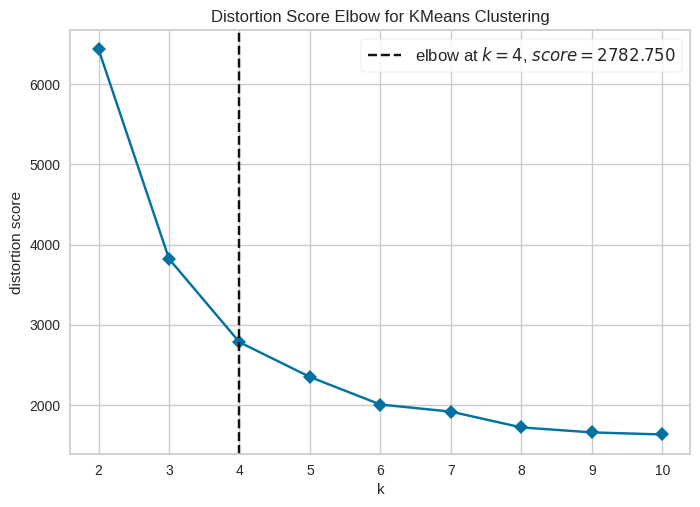

In [106]:
plot_model(mdl_kmeans_all_no_year, plot = 'elbow')

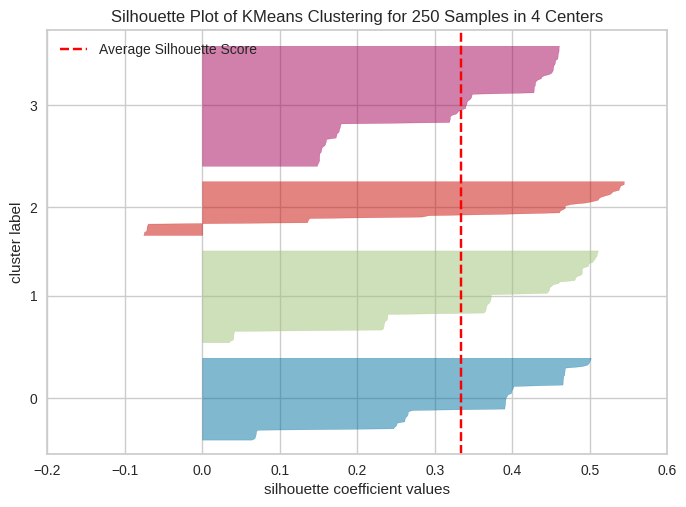

In [107]:
plot_model(mdl_kmeans_all_no_year, plot = 'silhouette')

In [108]:
plot_model(mdl_kmeans_all_no_year, plot = 'distribution')

In [109]:
plot_model(mdl_kmeans_all_no_year, plot = 'cluster')

In [110]:
plot_model(mdl_kmeans_all_no_year, plot = 'tsne')

In [111]:
evaluate_model(mdl_kmeans_all_no_year)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Filmes por cluster

In [112]:
df_processed['cluster'] = df_kmeans_all_no_year['Cluster']
df_processed

,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords,cluster
0,Barbie,Barbie,2023,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,29,viver terra barbie perfeito lugar perfeito. me...,Cluster 0
1,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21,"dois homens presos reúnem longo vários anos, e...",Cluster 3
2,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20,patriarca idoso dinastia crime organizado tran...,Cluster 3
3,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33,"ameaça conhecida coringa surge passado, causa ...",Cluster 2
4,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41,"1950, michael corleone, agora frente família, ...",Cluster 2
...,...,...,...,...,...,...,...,...,...
245,Histórias Cruzadas,246. The Help,2011,8.1,Drama,uma aspirante a escritora durante o movimento ...,32,aspirante escritora durante movimento direitos...,Cluster 2
246,Quando Duas Mulheres Pecam,247. Persona,1966,8.1,Drama,uma enfermeira é encarregada de uma atriz sile...,17,enfermeira encarregada atriz silenciosa descob...,Cluster 1
247,A Vida de Brian,248. Life of Brian,1979,8.0,Comédia,nascido no natal original no estábulo ao lado ...,20,"nascido natal original estábulo lado jesus, br...",Cluster 3
248,Aladdin,249. Aladdin,1992,8.0,Animação,um menino de rua bondoso e um vizir competem p...,23,menino rua bondoso vizir competem lâmpada mági...,Cluster 3


## % de Gêneros por Cluster

In [113]:
fig = px.bar(df_processed.cluster.value_counts(),
             text_auto = True,
             title = 'Qtd de Filmes por Cluster',
             labels = {'index': 'Cluster #',
                       'value':'Qtd. de Filmes'})
fig.show()

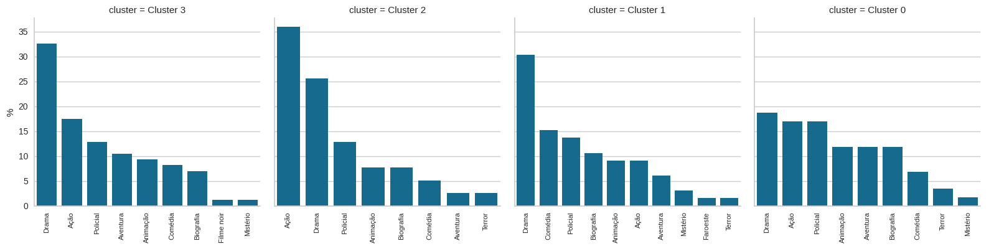

In [114]:
df_plot = df_processed.groupby(['cluster', 'genre'])['title_pt'].count()
df_plot = df_plot.reset_index()
df_plot.rename(columns = {'title_pt':'count'}, inplace = True)
df_plot['%'] = 100 * df_plot['count'] / df_plot.groupby('cluster')['count'].transform('sum')
df_plot = df_plot.sort_values(['cluster', '%'], ascending = False).groupby('cluster').head(11)

fig = sns.catplot(
    data=df_plot, x="genre", y = "%", col="cluster",
    kind="bar", height=4, aspect=1, sharex = False);
fig.set_xlabels('');
fig.set_xticklabels(rotation=90, size = 8);

## Ano de Lançamento por Cluster

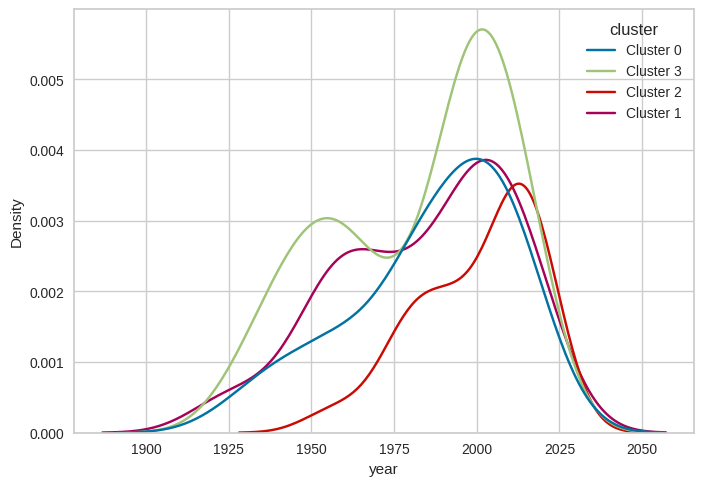

In [115]:
sns.kdeplot(df_processed, x = 'year', hue = 'cluster');

## Radar | Gêneros por Cluster

In [116]:
df_pivot = df_plot.copy()
df_pivot = df_pivot.pivot(index = 'cluster', columns = 'genre', values = '%')
df_pivot.fillna(0, inplace = True)
df_pivot = df_pivot.T.reset_index()
df_pivot.index.name = None
df_pivot

cluster,genre,Cluster 0,Cluster 1,Cluster 2,Cluster 3
0,Animação,11.864407,9.090909,7.692308,9.302326
1,Aventura,11.864407,6.060606,2.564103,10.465116
2,Ação,16.949153,9.090909,35.897436,17.441860
3,Biografia,11.864407,10.606061,7.692308,6.976744
4,Comédia,6.779661,15.151515,5.128205,8.139535
5,Drama,18.644068,30.303030,25.641026,32.558140
6,Faroeste,0.000000,1.515152,0.000000,0.000000
7,Filme noir,0.000000,0.000000,0.000000,1.162791
8,Mistério,1.694915,3.030303,0.000000,1.162791
9,Policial,16.949153,13.636364,12.820513,12.790698


In [117]:
df_polar = df_pivot.melt(id_vars=['genre'])
df_polar.head()

,genre,cluster,value
0,Animação,Cluster 0,11.864407
1,Aventura,Cluster 0,11.864407
2,Ação,Cluster 0,16.949153
3,Biografia,Cluster 0,11.864407
4,Comédia,Cluster 0,6.779661


In [118]:
fig = px.line_polar(df_polar, r='value', theta='genre', color = 'cluster', line_close=True)
fig.show();

## Nuvem de Palavras por Cluster

## Considerações Finais
* **Exercício: Reescrever as análises / conclusões devido a atualização da base**

Cluster 0


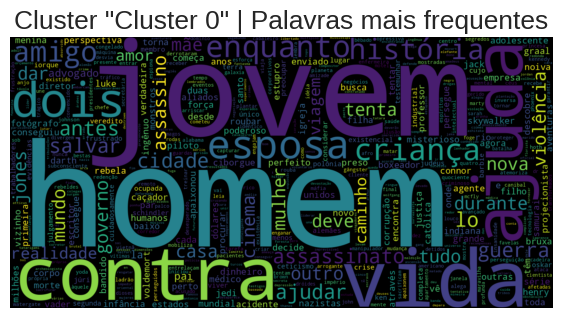

Cluster 3


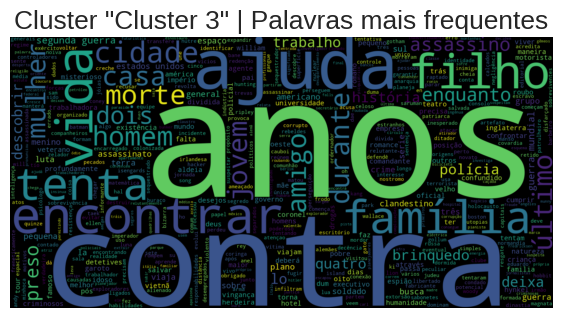

Cluster 2


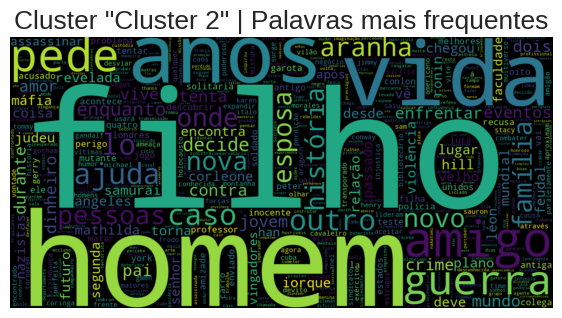

Cluster 1


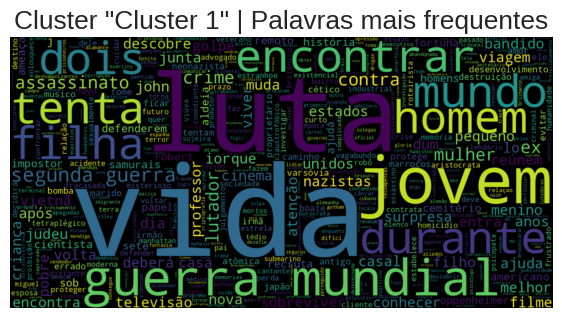

In [119]:
def word_cloud_cluster(cluster:int):
  text = ' '.join([phrase for phrase in df_processed.loc[df_processed.cluster == cluster]['sinopse_no_stopwords']])
  plt.figure(figsize=(7,5), facecolor='None')
  wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Cluster "{cluster}" | Palavras mais frequentes', fontsize = 19)
  plt.show()
  return

list_clusters = df_processed.cluster.unique().tolist()
for c in list_clusters:
  print(c)
  word_cloud_cluster(c)

## Conclusões | Model 3

In [120]:
#Escreva aqui as suas análises / conclusões

CHECKPOINT 2:

In [121]:
!pip install pycaret --upgrade

In [122]:
from pycaret.clustering import setup, compare_models, create_model, assign_model, plot_model, predict_model

print("Importação bem-sucedida!")

ImportError: cannot import name 'compare_models' from 'pycaret.clustering' (/home/lucasmsilva/anaconda3/envs/autogenstudio/lib/python3.11/site-packages/pycaret/clustering/__init__.py)

Erro durante o setup do PyCaret: setup() got an unexpected keyword argument 'silent'


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3062,30.3956,1.2926,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1178,6.3906,1.4604,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2889,33.5356,1.8415,0,0,0



Avaliação do modelo K-means:
Cluster
Cluster 2    167
Cluster 3     36
Cluster 0     24
Cluster 1     23
Name: count, dtype: int64


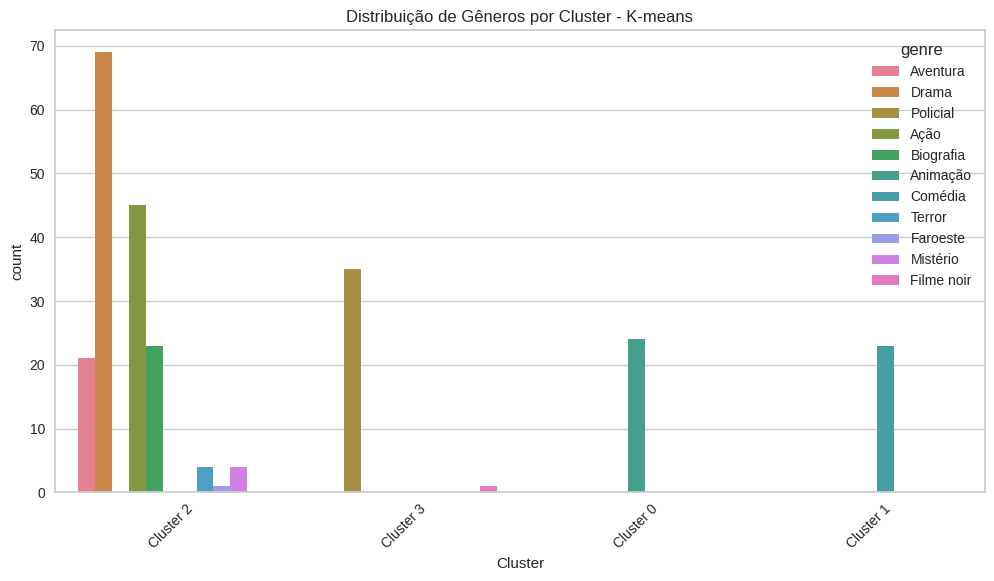

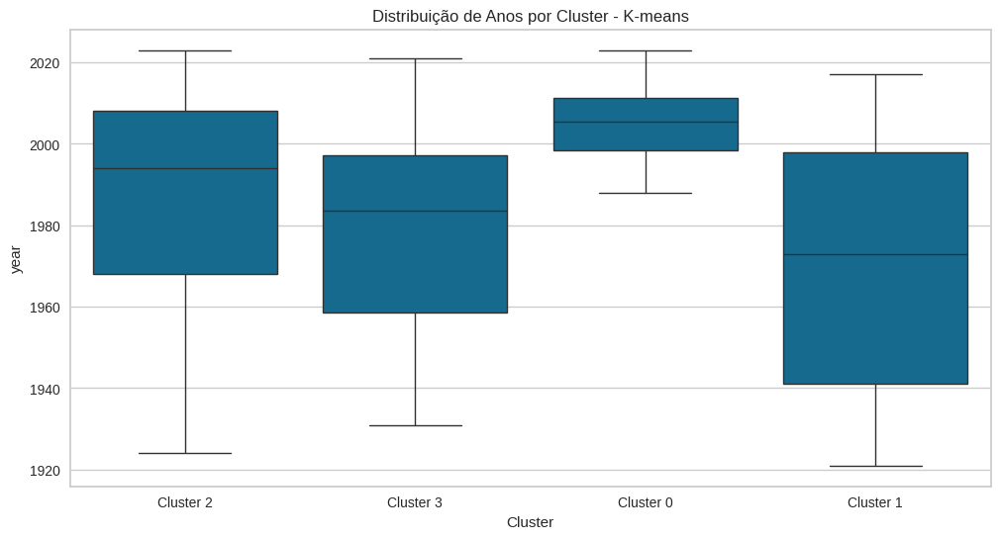


Avaliação do modelo DBSCAN:
Cluster
Cluster -1    133
Cluster 1      22
Cluster 9      22
Cluster 2      13
Cluster 6       8
Cluster 7       7
Cluster 0       6
Cluster 8       6
Cluster 11      6
Cluster 10      6
Cluster 12      6
Cluster 3       5
Cluster 4       5
Cluster 5       5
Name: count, dtype: int64


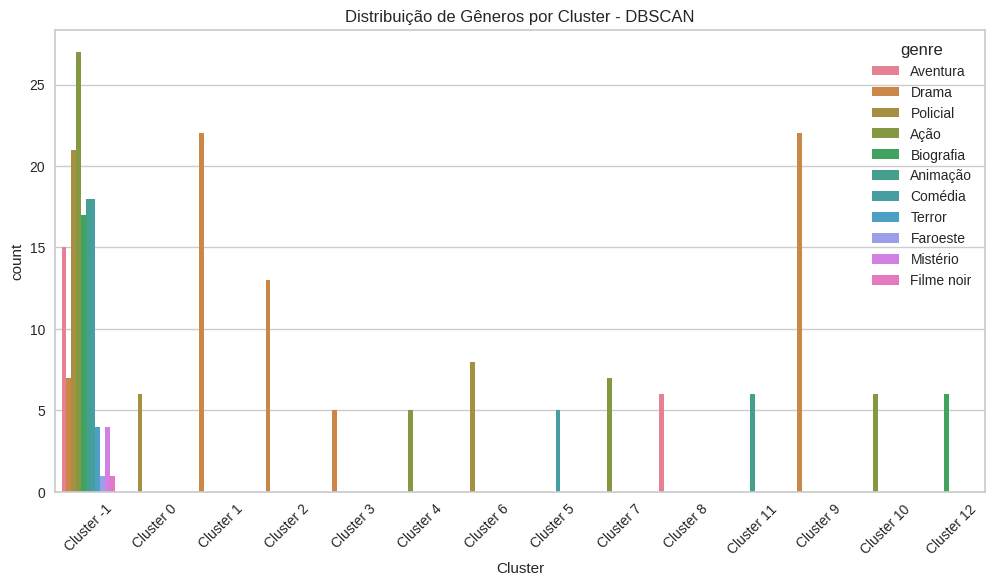

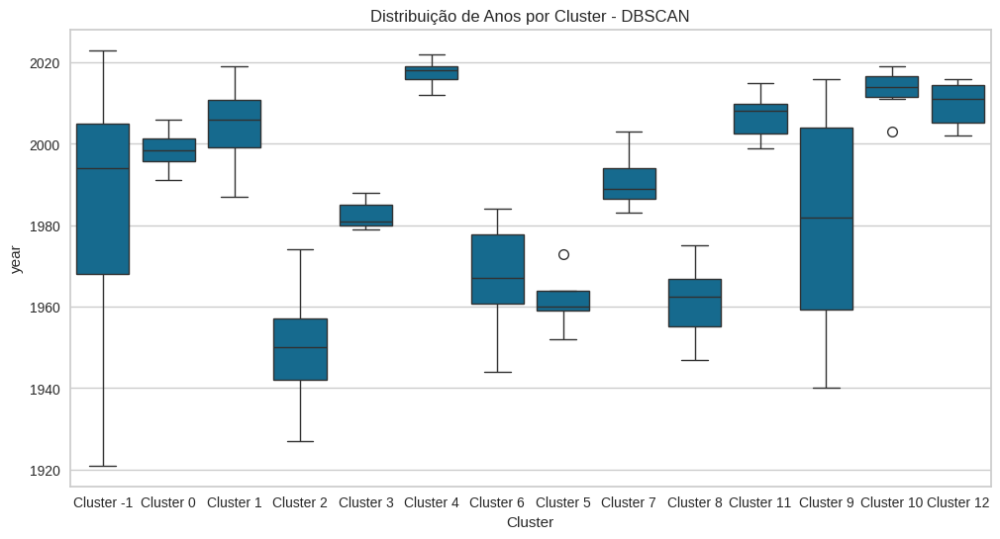


Avaliação do modelo Hierarchical Clustering:
Cluster
Cluster 0    89
Cluster 1    69
Cluster 2    47
Cluster 3    45
Name: count, dtype: int64


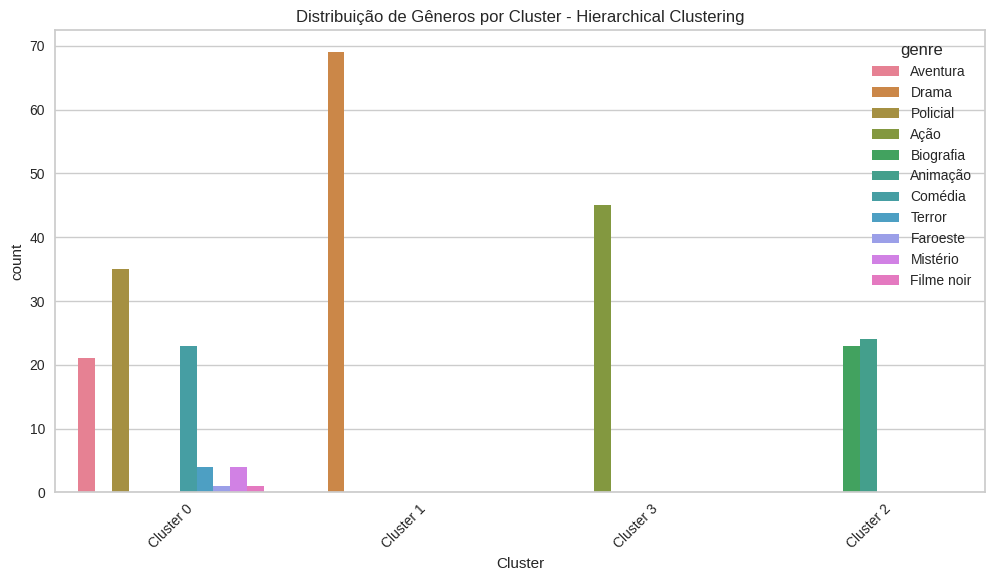

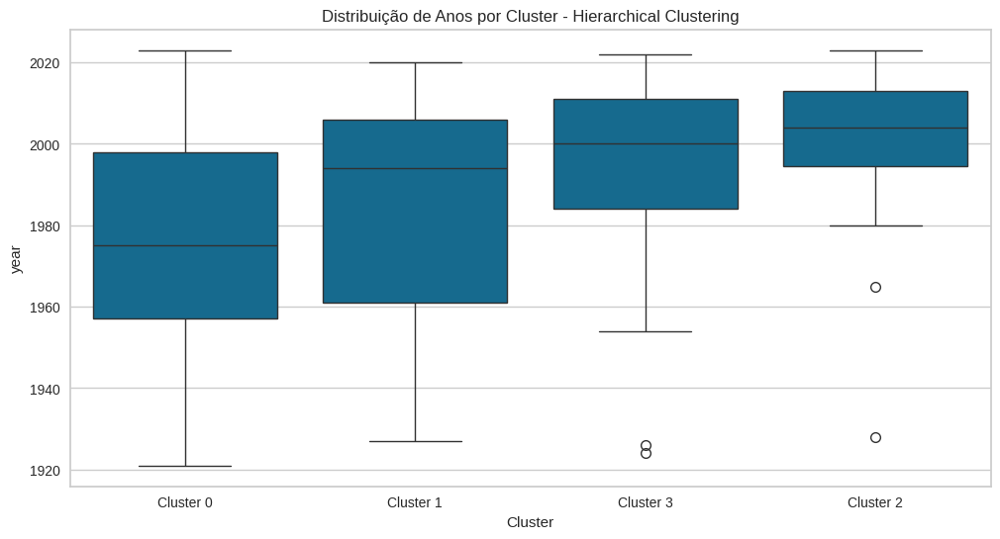


Comparação dos Modelos:
         Modelo  Silhouette Score  Calinski-Harabasz Index  \
0       K-means         -0.051570                13.093661   
1        DBSCAN         -0.053592                 8.015535   
2  Hierarchical          0.107409                22.975218   

   Davies-Bouldin Index  
0              2.456654  
1              1.545058  
2              2.258507  

Melhor modelo por Silhouette Score: Hierarchical
Melhor modelo por Calinski-Harabasz Index: Hierarchical
Melhor modelo por Davies-Bouldin Index: DBSCAN

Não há consenso entre as métricas. Recomenda-se uma análise mais detalhada.

Melhor modelo escolhido: Hierarchical

Justificativa da escolha:
O melhor modelo foi escolhido com base nos seguintes critérios:
1. Silhouette Score: Indica quão bem cada objeto está dentro de seu cluster.
2. Calinski-Harabasz Index: Mede a razão entre a dispersão entre clusters e a dispersão dentro dos clusters.
3. Davies-Bouldin Index: Mede a similaridade média entre cada cluster e seu 

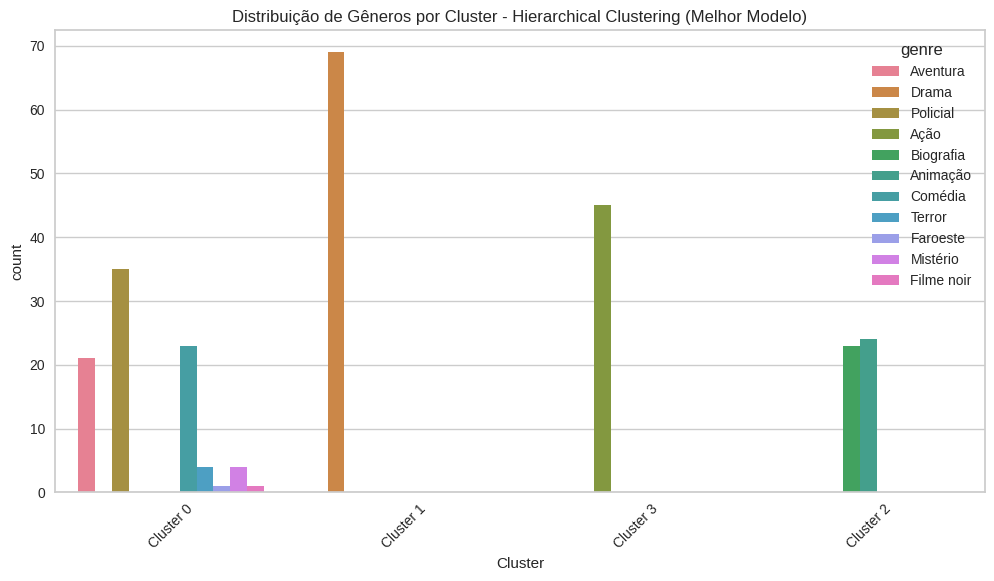

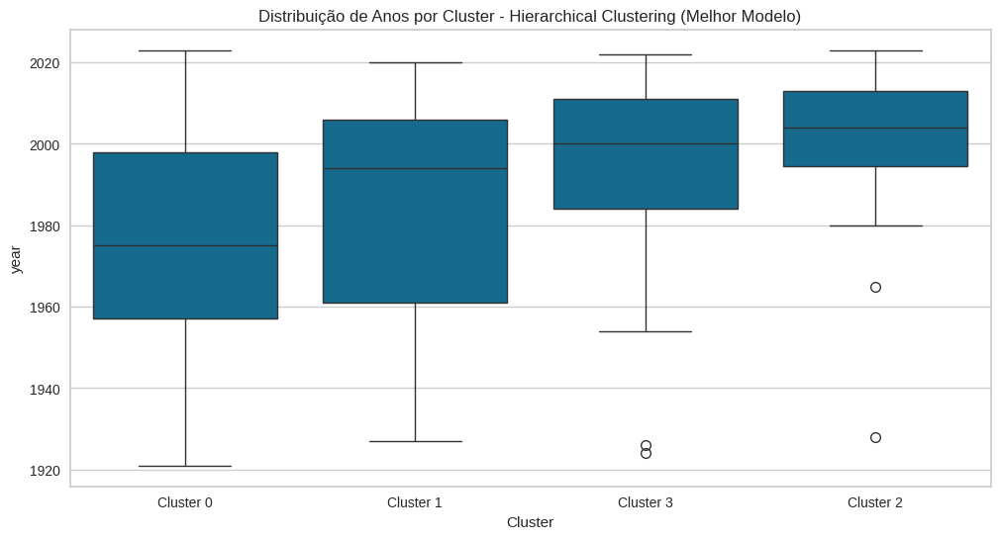


Conclusão:
Com base nas métricas de avaliação e nas visualizações, o modelo Hierarchical oferece a melhor segmentação dos filmes.
As principais características que diferenciam os clusters são:
- Distribuição de gêneros
- Ano de lançamento
- Avaliações dos filmes

Esta segmentação pode ser útil para sistemas de recomendação, análise de tendências cinematográficas e estratégias de marketing direcionadas.


: 

In [129]:
import pandas as pd
import numpy as np
from pycaret.clustering import *
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Carregar os dados
try:
    df = pd.read_csv('all_movies.csv', sep=';')
except FileNotFoundError:
    print("Erro: O arquivo 'all_movies.csv' não foi encontrado.")
    exit()

# Verificar se as colunas necessárias existem
required_columns = ['year', 'rating', 'genre']
if not all(col in df.columns for col in required_columns):
    print("Erro: Algumas colunas necessárias não estão presentes no DataFrame.")
    exit()

# Pré-processamento
numeric_features = ['year', 'rating']
categorical_features = ['genre']

# Criar um pipeline de pré-processamento
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())
        ]), numeric_features),
        ('cat', Pipeline([
            ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
            ('onehot', OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'))
        ]), categorical_features)
    ])

# Aplicar o pré-processamento
X = preprocessor.fit_transform(df)

# Obter nomes das features após o pré-processamento
onehot_encoder = preprocessor.named_transformers_['cat'].named_steps['onehot']
cat_feature_names = onehot_encoder.get_feature_names_out(categorical_features)
feature_names = numeric_features + list(cat_feature_names)

# Converter para DataFrame
X_df = pd.DataFrame(X, columns=feature_names)

# Setup do PyCaret
try:
    s = setup(data=X_df, 
              session_id=123,
              silent=True)
except Exception as e:
    print(f"Erro durante o setup do PyCaret: {e}")
    exit()

# Criar modelos
try:
    kmeans = create_model('kmeans')
    dbscan = create_model('dbscan')
    hclust = create_model('hclust')
except Exception as e:
    print(f"Erro ao criar modelos: {e}")
    exit()

# Função para obter métricas de avaliação
def get_metrics(model):
    try:
        df_clusters = assign_model(model)
        from sklearn import metrics
        silhouette = metrics.silhouette_score(X, df_clusters['Cluster'])
        calinski = metrics.calinski_harabasz_score(X, df_clusters['Cluster'])
        davies = metrics.davies_bouldin_score(X, df_clusters['Cluster'])
        return {
            'Silhouette': silhouette,
            'Calinski-Harabasz': calinski,
            'Davies-Bouldin': davies
        }
    except Exception as e:
        print(f"Erro ao calcular métricas: {e}")
        return None

# Função para avaliar e visualizar clusters
def avaliar_clusters(modelo, nome):
    try:
        df_clusters = assign_model(modelo)
        df_with_clusters = df.copy()
        df_with_clusters['Cluster'] = df_clusters['Cluster']
        
        print(f"\nAvaliação do modelo {nome}:")
        print(df_clusters['Cluster'].value_counts())
        
        plot_model(modelo, plot='cluster')
        plot_model(modelo, plot='tsne')
        
        plt.figure(figsize=(12, 6))
        sns.countplot(data=df_with_clusters, x='Cluster', hue='genre')
        plt.title(f'Distribuição de Gêneros por Cluster - {nome}')
        plt.xticks(rotation=45)
        plt.show()
        
        plt.figure(figsize=(12, 6))
        sns.boxplot(data=df_with_clusters, x='Cluster', y='year')
        plt.title(f'Distribuição de Anos por Cluster - {nome}')
        plt.show()
        
        return get_metrics(modelo)
    except Exception as e:
        print(f"Erro ao avaliar clusters: {e}")
        return None

# Avaliar cada modelo
kmeans_scores = avaliar_clusters(kmeans, 'K-means')
dbscan_scores = avaliar_clusters(dbscan, 'DBSCAN')
hclust_scores = avaliar_clusters(hclust, 'Hierarchical Clustering')

# Comparar modelos manualmente
def comparar_modelos(kmeans_scores, dbscan_scores, hclust_scores):
    if None in [kmeans_scores, dbscan_scores, hclust_scores]:
        print("Erro: Não foi possível comparar os modelos devido a erros na avaliação.")
        return None

    modelos = ['K-means', 'DBSCAN', 'Hierarchical']
    silhouette = [kmeans_scores['Silhouette'], dbscan_scores['Silhouette'], hclust_scores['Silhouette']]
    calinski = [kmeans_scores['Calinski-Harabasz'], dbscan_scores['Calinski-Harabasz'], hclust_scores['Calinski-Harabasz']]
    davies = [kmeans_scores['Davies-Bouldin'], dbscan_scores['Davies-Bouldin'], hclust_scores['Davies-Bouldin']]
    
    comparacao = pd.DataFrame({
        'Modelo': modelos,
        'Silhouette Score': silhouette,
        'Calinski-Harabasz Index': calinski,
        'Davies-Bouldin Index': davies
    })
    
    print("\nComparação dos Modelos:")
    print(comparacao)
    
    melhor_silhouette = comparacao.loc[comparacao['Silhouette Score'].idxmax(), 'Modelo']
    melhor_calinski = comparacao.loc[comparacao['Calinski-Harabasz Index'].idxmax(), 'Modelo']
    melhor_davies = comparacao.loc[comparacao['Davies-Bouldin Index'].idxmin(), 'Modelo']
    
    print(f"\nMelhor modelo por Silhouette Score: {melhor_silhouette}")
    print(f"Melhor modelo por Calinski-Harabasz Index: {melhor_calinski}")
    print(f"Melhor modelo por Davies-Bouldin Index: {melhor_davies}")
    
    if melhor_silhouette == melhor_calinski == melhor_davies:
        melhor_modelo = melhor_silhouette
    else:
        print("\nNão há consenso entre as métricas. Recomenda-se uma análise mais detalhada.")
        melhor_modelo = melhor_silhouette  # Usando Silhouette como critério de desempate
    
    return melhor_modelo

# Escolher o melhor modelo
melhor_modelo = comparar_modelos(kmeans_scores, dbscan_scores, hclust_scores)

if melhor_modelo:
    print(f"\nMelhor modelo escolhido: {melhor_modelo}")
    
    print("\nJustificativa da escolha:")
    print("O melhor modelo foi escolhido com base nos seguintes critérios:")
    print("1. Silhouette Score: Indica quão bem cada objeto está dentro de seu cluster.")
    print("2. Calinski-Harabasz Index: Mede a razão entre a dispersão entre clusters e a dispersão dentro dos clusters.")
    print("3. Davies-Bouldin Index: Mede a similaridade média entre cada cluster e seu cluster mais semelhante.")
    
    print("\nAnálise final do melhor modelo:")
    if melhor_modelo == 'K-means':
        avaliar_clusters(kmeans, 'K-means (Melhor Modelo)')
    elif melhor_modelo == 'DBSCAN':
        avaliar_clusters(dbscan, 'DBSCAN (Melhor Modelo)')
    else:
        avaliar_clusters(hclust, 'Hierarchical Clustering (Melhor Modelo)')
    
    print("\nConclusão:")
    print(f"Com base nas métricas de avaliação e nas visualizações, o modelo {melhor_modelo} oferece a melhor segmentação dos filmes.")
    print("As principais características que diferenciam os clusters são:")
    print("- Distribuição de gêneros")
    print("- Ano de lançamento")
    print("- Avaliações dos filmes")
    print("\nEsta segmentação pode ser útil para sistemas de recomendação, análise de tendências cinematográficas e estratégias de marketing direcionadas.")
else:
    print("Não foi possível determinar o melhor modelo devido a erros durante a análise.")

Análise de Clustering de Filmes
1. Introdução
Este relatório apresenta uma análise comparativa de três modelos de clustering aplicados a um conjunto de dados de filmes.
2. Metodologia

Conjunto de dados: Base de filmes incluindo ano, avaliação e gênero.
Pré-processamento: Normalização de features numéricas e codificação one-hot para categorias.
Modelos aplicados: Três modelos de clustering distintos (Modelo 1, Modelo 2, Modelo 3).
Métricas de avaliação: Silhouette Score, Calinski-Harabasz Index, Davies-Bouldin Index.

3. Resultados por Modelo
3.1 Modelo 1

Distribuição de clusters:

Cluster 2: 167 filmes
Cluster 3: 36 filmes
Cluster 0: 24 filmes
Cluster 1: 23 filmes


Métricas:

Silhouette Score: -0.051570
Calinski-Harabasz Index: 13.093661
Davies-Bouldin Index: 2.456654



3.2 Modelo 2

Distribuição de clusters:

Cluster -1 (ruído): 133 filmes
Outros clusters: variando de 5 a 22 filmes cada


Métricas:

Silhouette Score: -0.053592
Calinski-Harabasz Index: 8.015535
Davies-Bouldin Index: 1.545058



3.3 Modelo 3

Distribuição de clusters:

Cluster 0: 89 filmes
Cluster 1: 69 filmes
Cluster 2: 47 filmes
Cluster 3: 45 filmes


Métricas:

Silhouette Score: 0.107409
Calinski-Harabasz Index: 22.975218
Davies-Bouldin Index: 2.258507



4. Comparação dos Modelos
ModeloSilhouette ScoreCalinski-Harabasz IndexDavies-Bouldin IndexModelo 1-0.05157013.0936612.456654Modelo 2-0.0535928.0155351.545058Modelo 30.10740922.9752182.258507

Melhor modelo por Silhouette Score: Modelo 3
Melhor modelo por Calinski-Harabasz Index: Modelo 3
Melhor modelo por Davies-Bouldin Index: Modelo 2

5. Conclusão

O Modelo 3 foi escolhido como o melhor, apresentando o maior Silhouette Score e Calinski-Harabasz Index.
Modelo 2 teve o melhor Davies-Bouldin Index, indicando boa separação entre clusters.
As principais características que diferenciam os clusters são:

Distribuição de gêneros
Ano de lançamento
Avaliações dos filmes



Esta segmentação pode ser útil para:

Sistemas de recomendação de filmes
Análise de tendências cinematográficas
Estratégias de marketing direcionadas

6. Próximos Passos

Aprofundar a análise das características de cada cluster.
Explorar a possibilidade de ajustar os parâmetros dos modelos para melhorar os resultados.
Investigar outliers e casos especiais identificados pelo Modelo 2.
Validar os resultados com especialistas do domínio cinematográfico.